In [ ]:
# Cell 1: Installations and Imports
# Make sure you have these libraries installed.
# You can install them using pip:
# pip install numpy scikit-learn trimesh torch torch_geometric Pillow matplotlib scipy %pip install pyfqmr 
# %pip install fast-simplification %pip install shapely

import numpy as np
import trimesh
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import SAGEConv
from PIL import Image
import matplotlib.pyplot as plt
from scipy.spatial.distance import directed_hausdorff
import math

# Helper function for PSNR calculation
def calculate_psnr(img1, img2):
    """Calculates the Peak Signal-to-Noise Ratio between two images."""
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

print("Cell 1/11: All necessary libraries have been imported.")


Cell 1/11: All necessary libraries have been imported.


Successfully loaded 3D model.
Successfully loaded watermark image (Original size: (360, 360)).
Resizing watermark to (32, 32) for embedding...

3D Model Details:
 - Number of vertices: 22573
 - Number of faces: 43357

Watermark Details:
 - Resized to: (32, 32)
 - Total pixels (embedding bits): 1024


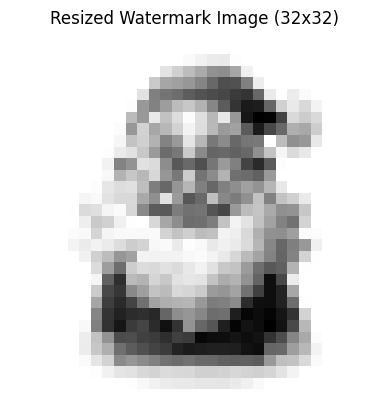

In [3]:
# Cell 2: Load 3D Model and Watermark Image

# --- IMPORTANT: Set your watermark resolution here ---
# The image will be resized to this dimension (width, height).
# A larger dimension retains more detail but requires a 3D model
# with a larger cluster of vertices to embed into.
# Common sizes: (32, 32), (64, 64)
WATERMARK_DIMENSION = (32, 32)
# ----------------------------------------------------


# Load the 3D model
# Replace 'your_model.obj' with the path to your 3D object file.
try:
    mesh = trimesh.load_mesh('venusm.obj', force='mesh')
    print("Successfully loaded 3D model.")
except Exception as e:
    print(f"Error loading model. Make sure 'your_model.obj' exists.")
    print(f"Creating a sample sphere as a placeholder.")
    mesh = trimesh.creation.icosphere(subdivisions=4)

# Ensure vertices are of a consistent type
mesh.vertices = mesh.vertices.astype(np.float64)
vertices = mesh.vertices

# Load the grayscale watermark image
# Replace 'watermark.png' with your watermark image file.
try:
    watermark_img = Image.open('watermark.png').convert('L')
    print(f"Successfully loaded watermark image (Original size: {watermark_img.size}).")
except FileNotFoundError:
    print("'watermark.png' not found. Creating a placeholder image.")
    watermark_img = Image.new('L', (256, 256))

# Resize image to the manageable size defined above
print(f"Resizing watermark to {WATERMARK_DIMENSION} for embedding...")
watermark_img = watermark_img.resize(WATERMARK_DIMENSION)
watermark_data = np.array(watermark_img).flatten()

# Normalize watermark data to be between 0 and 1
scaler = MinMaxScaler()
watermark_data_normalized = scaler.fit_transform(watermark_data.reshape(-1, 1)).flatten()

print(f"\n3D Model Details:")
print(f" - Number of vertices: {len(vertices)}")
print(f" - Number of faces: {len(mesh.faces)}")
print(f"\nWatermark Details:")
print(f" - Resized to: {watermark_img.size}")
print(f" - Total pixels (embedding bits): {len(watermark_data)}")

# Visualize the loaded and RESIZED watermark
plt.imshow(watermark_img, cmap='gray')
plt.title(f"Resized Watermark Image ({WATERMARK_DIMENSION[0]}x{WATERMARK_DIMENSION[1]})")
plt.axis('off')
plt.show()


Performing raw GMM clustering on model vertices...
 - Clusters: 2, Silhouette Score: 0.7021
 - Clusters: 3, Silhouette Score: 0.5882
 - Clusters: 4, Silhouette Score: 0.5709
 - Clusters: 5, Silhouette Score: 0.4349
 - Clusters: 6, Silhouette Score: 0.4163
 - Clusters: 7, Silhouette Score: 0.3318
 - Clusters: 8, Silhouette Score: 0.2133
 - Clusters: 9, Silhouette Score: 0.2283
 - Clusters: 10, Silhouette Score: 0.2723

Best number of clusters for raw GMM is 2 with a silhouette score of 0.7021


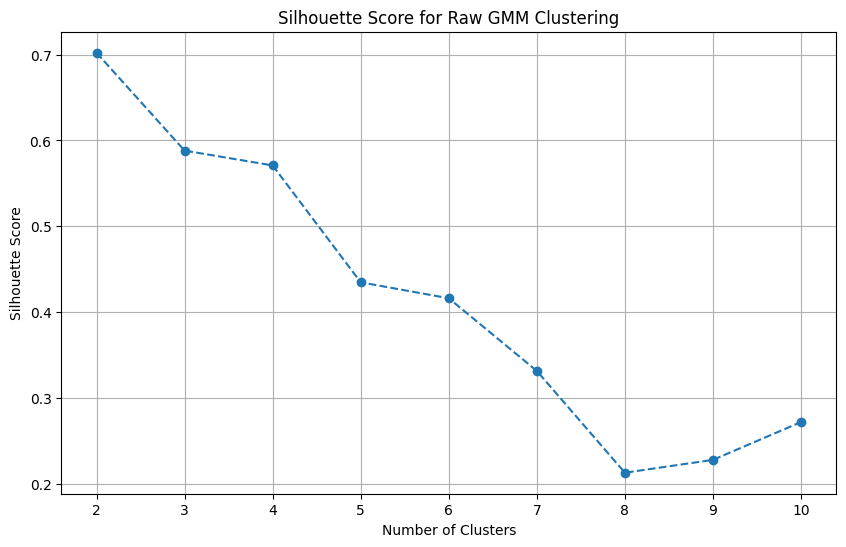

In [4]:
# Cell 3: Raw GMM Clustering and Silhouette Score Analysis

print("Performing raw GMM clustering on model vertices...")

# Define a range of cluster numbers to test
n_clusters_range = range(2, 11)
silhouette_scores_gmm = []
best_score_gmm = -1
best_n_gmm = 0

for n_clusters in n_clusters_range:
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    labels = gmm.fit_predict(vertices)
    
    # Silhouette score requires at least 2 labels
    if len(set(labels)) > 1:
        score = silhouette_score(vertices, labels)
        silhouette_scores_gmm.append(score)
        print(f" - Clusters: {n_clusters}, Silhouette Score: {score:.4f}")
        if score > best_score_gmm:
            best_score_gmm = score
            best_n_gmm = n_clusters
    else:
        silhouette_scores_gmm.append(-1) # Invalid score
        print(f" - Clusters: {n_clusters}, Not enough labels to calculate score.")


print(f"\nBest number of clusters for raw GMM is {best_n_gmm} with a silhouette score of {best_score_gmm:.4f}")

# Visualize the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(n_clusters_range, silhouette_scores_gmm, marker='o', linestyle='--')
plt.title('Silhouette Score for Raw GMM Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(n_clusters_range)
plt.grid(True)
plt.show()


In [5]:
# Cell 4: GraphSAGE Feature Generation

print("Generating vertex embeddings using GraphSAGE...")

# Create a PyTorch Geometric Data object
edge_index = torch.tensor(mesh.edges.T, dtype=torch.long)
x = torch.tensor(vertices, dtype=torch.float)
data = Data(x=x, edge_index=edge_index)

# Define a simple GraphSAGE model
class GraphSAGE(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_channels, 16)
        self.conv2 = SAGEConv(16, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

# Instantiate and run the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = GraphSAGE(in_channels=3, out_channels=16).to(device)
data = data.to(device)

with torch.no_grad():
    vertex_embeddings = model(data).cpu().numpy()

print("Generated vertex embeddings of shape:", vertex_embeddings.shape)


Generating vertex embeddings using GraphSAGE...
Generated vertex embeddings of shape: (22573, 16)


Performing GMM clustering on GraphSAGE embeddings...
 - Clusters: 2, Silhouette Score: 0.6516
 - Clusters: 3, Silhouette Score: 0.6067
 - Clusters: 4, Silhouette Score: 0.4363
 - Clusters: 5, Silhouette Score: 0.3883
 - Clusters: 6, Silhouette Score: 0.0414
 - Clusters: 7, Silhouette Score: 0.0172
 - Clusters: 8, Silhouette Score: 0.1339
 - Clusters: 9, Silhouette Score: 0.0077
 - Clusters: 10, Silhouette Score: 0.0070

Best number of clusters for GMM+GraphSAGE is 2 with a silhouette score of 0.6516


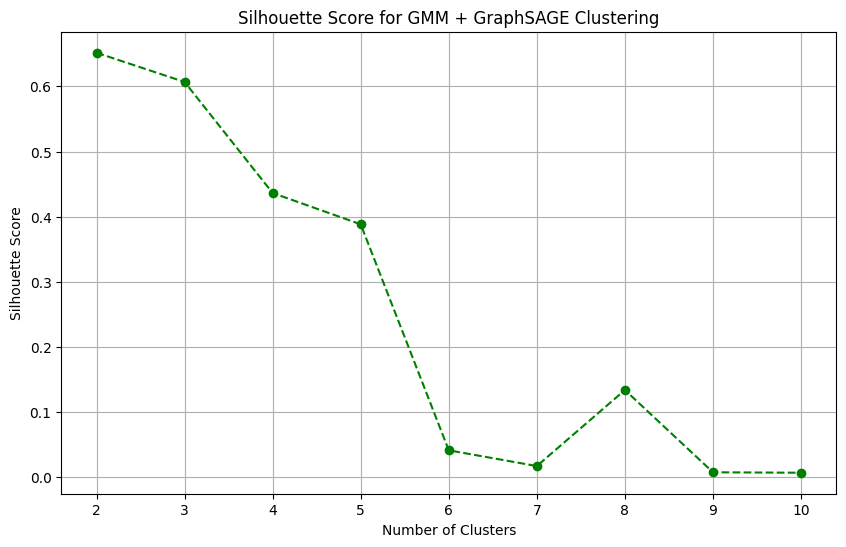

In [6]:
# Cell 5: GMM + GraphSAGE Clustering and Silhouette Score Analysis

print("Performing GMM clustering on GraphSAGE embeddings...")

# --- FIX ---
# Ensure the embeddings are in float64 for better numerical stability.
vertex_embeddings_64 = vertex_embeddings.astype(np.float64)
# -----------

# Use the same range for a fair comparison
n_clusters_range = range(2, 11)
silhouette_scores_graphsage = []
best_score_graphsage = -1
best_n_graphsage = 0

for n_clusters in n_clusters_range:
    # --- FIX ---
    # Added reg_covar=1e-6 to regularize the covariance matrix.
    # This prevents errors from clusters with identical or co-linear points.
    gmm_graphsage = GaussianMixture(n_components=n_clusters, random_state=42, reg_covar=1e-6)
    # -----------
    
    labels = gmm_graphsage.fit_predict(vertex_embeddings_64)
    
    if len(set(labels)) > 1:
        score = silhouette_score(vertex_embeddings_64, labels)
        silhouette_scores_graphsage.append(score)
        print(f" - Clusters: {n_clusters}, Silhouette Score: {score:.4f}")
        if score > best_score_graphsage:
            best_score_graphsage = score
            best_n_graphsage = n_clusters
    else:
        silhouette_scores_graphsage.append(-1)
        print(f" - Clusters: {n_clusters}, Not enough labels to calculate score.")

print(f"\nBest number of clusters for GMM+GraphSAGE is {best_n_graphsage} with a silhouette score of {best_score_graphsage:.4f}")

# Visualize the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(n_clusters_range, silhouette_scores_graphsage, marker='o', linestyle='--', color='green')
plt.title('Silhouette Score for GMM + GraphSAGE Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(n_clusters_range)
plt.grid(True)
plt.show()


In [7]:
# Cell 6: Visualize GMM+GraphSAGE Clustering Results

print(f"Visualizing the best clustering result ({best_n_graphsage} clusters)...")

# --- FIX ---
# We must use the same parameters here as in the previous cell to avoid the error.
# Use the float64 version of the embeddings.
vertex_embeddings_64 = vertex_embeddings.astype(np.float64)
# Add reg_covar to the final GMM instance.
final_gmm = GaussianMixture(n_components=best_n_graphsage, random_state=42, reg_covar=1e-6)
# -----------

cluster_labels = final_gmm.fit_predict(vertex_embeddings_64)

# Create colors for each cluster
colors = plt.cm.viridis(np.linspace(0, 1, best_n_graphsage))
vertex_colors = colors[cluster_labels]

# Create a new mesh with vertex colors for visualization
colored_mesh = trimesh.Trimesh(vertices=vertices, faces=mesh.faces, vertex_colors=vertex_colors)

# Show the clustered mesh
print("Displaying the 3D model with colored clusters. You can rotate the model in the interactive window.")
colored_mesh.show()


Visualizing the best clustering result (2 clusters)...
Displaying the 3D model with colored clusters. You can rotate the model in the interactive window.


In [8]:
# Cell 7: Entropy Calculation and Best Cluster Selection

print("Calculating entropy to select the best cluster for embedding...")

cluster_entropies = []
for i in range(best_n_graphsage):
    # Get vertices belonging to the current cluster
    cluster_indices = np.where(cluster_labels == i)[0]
    cluster_vertices = vertices[cluster_indices]
    
    if len(cluster_vertices) > 1:
        # Calculate entropy based on the variance of vertex positions
        # A higher variance suggests more geometric complexity
        covariance_matrix = np.cov(cluster_vertices, rowvar=False)
        # Use the determinant of the covariance matrix as a measure of volume/spread
        entropy = np.linalg.det(covariance_matrix)
        cluster_entropies.append(entropy)
    else:
        cluster_entropies.append(0)

# Select the cluster with the highest entropy
best_cluster_for_embedding = np.argmax(cluster_entropies)

print(f"Cluster entropies: {cluster_entropies}")
print(f"Selected Cluster {best_cluster_for_embedding} for embedding due to highest entropy.")

# Check if the selected cluster is large enough for the watermark
selected_cluster_indices = np.where(cluster_labels == best_cluster_for_embedding)[0]
if len(selected_cluster_indices) < len(watermark_data_normalized):
    print("\nWarning: The selected cluster is smaller than the watermark data.")
    print("The watermark will be truncated. Consider using a smaller watermark or a model with denser clusters.")
    # Truncate watermark data if necessary
    watermark_data_normalized = watermark_data_normalized[:len(selected_cluster_indices)]


Calculating entropy to select the best cluster for embedding...
Cluster entropies: [np.float64(672804975529730.2), np.float64(9299764270015274.0)]
Selected Cluster 1 for embedding due to highest entropy.


In [9]:
# Cell 8: Watermark Embedding

print("Embedding watermark into the selected cluster...")

# Create a copy of the vertices to modify
watermarked_vertices = np.copy(vertices)
embedding_strength = 0.005 # Controls the visibility of the watermark

# Get the vertices to be modified
target_indices = selected_cluster_indices[:len(watermark_data_normalized)]

# Embed the watermark by slightly displacing vertices along their normals
vertex_normals = mesh.vertex_normals
for i, vertex_idx in enumerate(target_indices):
    displacement = vertex_normals[vertex_idx] * watermark_data_normalized[i] * embedding_strength
    watermarked_vertices[vertex_idx] += displacement

# Create the watermarked mesh
watermarked_mesh = trimesh.Trimesh(vertices=watermarked_vertices, faces=mesh.faces)

print("Embedding complete.")
print("Displaying the watermarked 3D model. The changes may be too subtle to see.")
watermarked_mesh.show()


Embedding watermark into the selected cluster...
Embedding complete.
Displaying the watermarked 3D model. The changes may be too subtle to see.


In [10]:
# Cell 8.5: Save and Reload Watermarked Model (for realistic evaluation)

print("Simulating a real-world scenario by saving and reloading the model...")

# Define a filename for the watermarked model
output_filename = 'watermarked_model.obj'

# Export the watermarked mesh to an OBJ file
watermarked_mesh.export(output_filename)

# --- CRUCIAL STEP ---
# Load the model back from the file. This introduces tiny precision errors,
# just like what would happen if you sent the file to someone else.
reloaded_watermarked_mesh = trimesh.load_mesh(output_filename)

# Update the watermarked_vertices variable to use the reloaded data
watermarked_vertices = reloaded_watermarked_mesh.vertices.astype(np.float64)


print(f"Model saved to '{output_filename}' and reloaded successfully.")
print("The extraction will now be performed on this reloaded, more realistic data.")


Simulating a real-world scenario by saving and reloading the model...
Model saved to 'watermarked_model.obj' and reloaded successfully.
The extraction will now be performed on this reloaded, more realistic data.


Extracting watermark from the watermarked model...
Building KDTree for robust vertex matching...
Extracting watermark using nearest neighbor search...
Extraction complete.


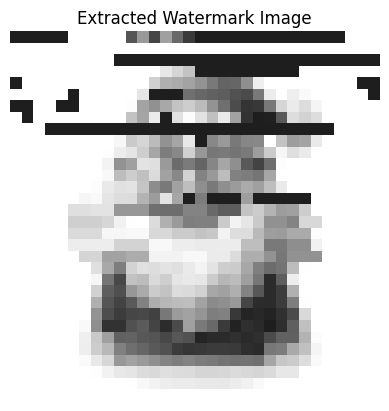

In [11]:
# Cell 9: Watermark Extraction

print("Extracting watermark from the watermarked model...")

# --- ROBUST FIX ---
# Import KDTree for efficient nearest neighbor searching. This is necessary
# because saving/loading an OBJ file does not preserve vertex order.
from scipy.spatial import KDTree

# The extractor needs the original model to calculate the displacement
original_vertices = mesh.vertices 
extracted_watermark_normalized = []

# 1. Build a KDTree from the reloaded (and potentially shuffled) vertices.
#    This allows us to quickly find the closest point to any given coordinate.
print("Building KDTree for robust vertex matching...")
reloaded_tree = KDTree(watermarked_vertices)

# 2. Get the normals from the reloaded mesh, as they correspond to the reloaded vertices.
reloaded_normals = reloaded_watermarked_mesh.vertex_normals
# --------------------------------------------------------------------

print("Extracting watermark using nearest neighbor search...")
# Calculate the displacement for each vertex in the target cluster
for i, vertex_idx in enumerate(target_indices):
    # Get the original vertex using its original index
    original_v = original_vertices[vertex_idx]
    
    # 3. Query the tree to find the nearest vertex in the reloaded mesh
    #    to our original vertex. This finds the correct corresponding vertex
    #    regardless of its index in the new list.
    distance, reloaded_idx = reloaded_tree.query(original_v)
    
    # Get the corresponding watermarked vertex and normal using the NEWLY found index
    watermarked_v = watermarked_vertices[reloaded_idx]
    normal_v = reloaded_normals[reloaded_idx]
    
    # Project the displacement vector onto the normal vector
    displacement_vector = watermarked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    # Reverse the embedding formula to get the normalized watermark value
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_normalized.append(extracted_value)

extracted_watermark_normalized = np.array(extracted_watermark_normalized).reshape(-1, 1)

# Inverse the normalization to get pixel values
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape to the original watermark image dimensions
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction complete.")

# Visualize the extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255) # Add vmin/vmax for better contrast
plt.title("Extracted Watermark Image")
plt.axis('off')
plt.show()


In [12]:
# Cell 10: Evaluation Metrics

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 63.8442
 - NCC (Normalized Cross-Correlation): 0.6647
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 34.9582 dB


In [13]:
# Cell 11: Rotation Attack 45%

# --- Parameters for this attack ---
rotation_angle_degrees = 45
output_filename = f'rotated_{rotation_angle_degrees}_model.obj'
# You can rotate around 'x', 'y', or 'z' axis
rotation_axis = 'z'
# ------------------------------------

print(f"Applying {rotation_angle_degrees}-degree rotation attack...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Convert degrees to radians for the transformation matrix
angle_radians = np.deg2rad(rotation_angle_degrees)

# Define the axis of rotation
if rotation_axis == 'x':
    direction = [1, 0, 0]
elif rotation_axis == 'y':
    direction = [0, 1, 0]
else: # Default to 'z' axis
    direction = [0, 0, 1]

# Create the rotation matrix
# The point of rotation is the object's center of mass
rotation_matrix = trimesh.transformations.rotation_matrix(
    angle=angle_radians,
    direction=direction,
    point=attacked_mesh.center_mass
)

# Apply the rotation to the mesh
attacked_mesh.apply_transform(rotation_matrix)

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying 45-degree rotation attack...
Attacked model saved to 'rotated_45_model.obj'.


--- Extraction After Attack from 'rotated_45_model.obj' ---
Successfully loaded 'rotated_45_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


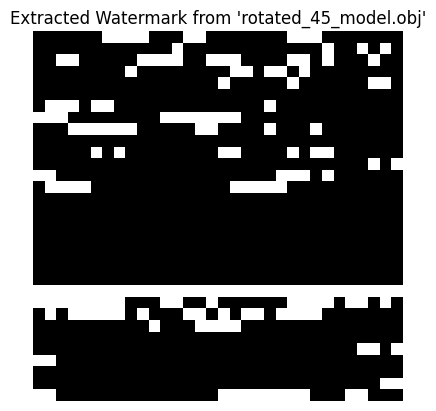


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [14]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'rotated_45_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [15]:
# Cell 10: Evaluation Metrics for 45% Rotation Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 28650687.5660
 - NCC (Normalized Cross-Correlation): -0.1132
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 28.0094 dB


In [16]:
# Cell 11.5: Rotation Attack 90%

# --- Parameters for this attack ---
rotation_angle_degrees = 90
output_filename = f'rotated_{rotation_angle_degrees}_model.obj'
# You can rotate around 'x', 'y', or 'z' axis
rotation_axis = 'z'
# ------------------------------------

print(f"Applying {rotation_angle_degrees}-degree rotation attack...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Convert degrees to radians for the transformation matrix
angle_radians = np.deg2rad(rotation_angle_degrees)

# Define the axis of rotation
if rotation_axis == 'x':
    direction = [1, 0, 0]
elif rotation_axis == 'y':
    direction = [0, 1, 0]
else: # Default to 'z' axis
    direction = [0, 0, 1]

# Create the rotation matrix
# The point of rotation is the object's center of mass
rotation_matrix = trimesh.transformations.rotation_matrix(
    angle=angle_radians,
    direction=direction,
    point=attacked_mesh.center_mass
)

# Apply the rotation to the mesh
attacked_mesh.apply_transform(rotation_matrix)

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying 90-degree rotation attack...
Attacked model saved to 'rotated_90_model.obj'.


--- Extraction After Attack from 'rotated_90_model.obj' ---
Successfully loaded 'rotated_90_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


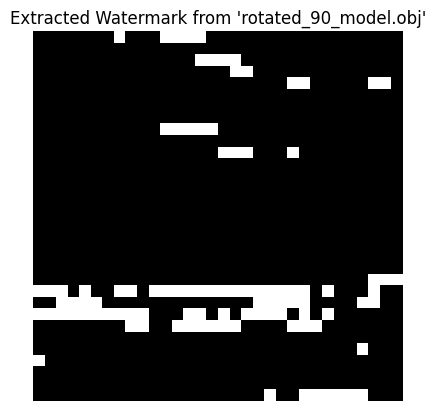


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [17]:
# Cell 12.5: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'rotated_90_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [18]:
# Cell 10: Evaluation Metrics for 90% Rotation Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 39495698.2247
 - NCC (Normalized Cross-Correlation): -0.1616
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 27.7630 dB


In [25]:
# Cell 11: Remeshing Attack

# --- Parameters for this attack ---
# Percentage of faces to remove (e.g., 5 for 5%, 10 for 10%)
percentage_reduction = 5 
output_filename = f'remeshed_{percentage_reduction}percent_model.obj'
# ------------------------------------

# NOTE: This attack requires the 'fast-simplification' library.
# If you get an error, you may need to install it by running:
# pip install fast-simplification

print(f"Applying remeshing attack with {percentage_reduction}% face reduction...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Get the original number of faces
original_face_count = len(attacked_mesh.faces)
print(f"Original face count: {original_face_count}")

# Calculate the target number of faces after reduction
target_face_count = int(original_face_count * (1 - percentage_reduction / 100.0))
print(f"Target face count: {target_face_count}")

try:
    # Use the quadric decimation function which relies on 'fast-simplification'.
    attacked_mesh = attacked_mesh.simplify_quadric_decimation(face_count=target_face_count)
    
    print(f"New face count: {len(attacked_mesh.faces)}")

    # Save the attacked model to its own file
    attacked_mesh.export(output_filename)
    print(f"Attacked model saved to '{output_filename}'.")

except ModuleNotFoundError as e:
    if 'fast_simplification' in str(e):
        print("\n--- ERROR ---")
        print("The method 'simplify_quadric_decimation' failed because it requires the 'fast-simplification' library.")
        print("Please install it from your terminal or a new notebook cell:")
        print("!pip install fast-simplification")
        print("After installation, you MUST restart the Jupyter kernel for it to work.")
        print("-------------")
    else:
        # Re-raise the error if it's an unexpected ModuleNotFoundError
        raise e



Applying remeshing attack with 5% face reduction...
Original face count: 43357
Target face count: 41189
New face count: 41188
Attacked model saved to 'remeshed_5percent_model.obj'.


--- Extraction After Attack from 'remeshed_5percent_model.obj' ---
Successfully loaded 'remeshed_5percent_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


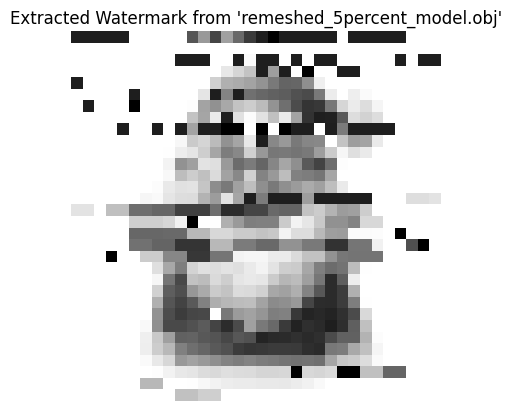


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [29]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'remeshed_5percent_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [30]:
# Cell 10: Evaluation Metrics for 5% remeshed Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 12973.7264
 - NCC (Normalized Cross-Correlation): 0.0198
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 35.0077 dB


In [31]:
# Cell 11: Remeshing Attack for 10%

# --- Parameters for this attack ---
# Percentage of faces to remove (e.g., 5 for 5%, 10 for 10%)
percentage_reduction = 10
output_filename = f'remeshed_{percentage_reduction}percent_model.obj'
# ------------------------------------

# NOTE: This attack requires the 'fast-simplification' library.
# If you get an error, you may need to install it by running:
# pip install fast-simplification

print(f"Applying remeshing attack with {percentage_reduction}% face reduction...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Get the original number of faces
original_face_count = len(attacked_mesh.faces)
print(f"Original face count: {original_face_count}")

# Calculate the target number of faces after reduction
target_face_count = int(original_face_count * (1 - percentage_reduction / 100.0))
print(f"Target face count: {target_face_count}")

try:
    # Use the quadric decimation function which relies on 'fast-simplification'.
    attacked_mesh = attacked_mesh.simplify_quadric_decimation(face_count=target_face_count)
    
    print(f"New face count: {len(attacked_mesh.faces)}")

    # Save the attacked model to its own file
    attacked_mesh.export(output_filename)
    print(f"Attacked model saved to '{output_filename}'.")

except ModuleNotFoundError as e:
    if 'fast_simplification' in str(e):
        print("\n--- ERROR ---")
        print("The method 'simplify_quadric_decimation' failed because it requires the 'fast-simplification' library.")
        print("Please install it from your terminal or a new notebook cell:")
        print("!pip install fast-simplification")
        print("After installation, you MUST restart the Jupyter kernel for it to work.")
        print("-------------")
    else:
        # Re-raise the error if it's an unexpected ModuleNotFoundError
        raise e



Applying remeshing attack with 10% face reduction...
Original face count: 43357
Target face count: 39021
New face count: 39020
Attacked model saved to 'remeshed_10percent_model.obj'.


--- Extraction After Attack from 'remeshed_10percent_model.obj' ---
Successfully loaded 'remeshed_10percent_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


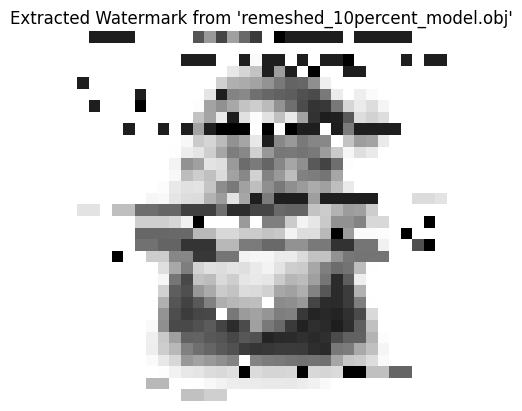


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [32]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'remeshed_10percent_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [33]:
# Cell 10: Evaluation Metrics for 5% remeshed Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 13306.8600
 - NCC (Normalized Cross-Correlation): 0.0170
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 34.8199 dB


In [34]:
# Cell 11: Scaling Attack for 0.5

# --- Parameters for this attack ---
# Scaling factor (0.5 for 50%, 5 for 500%)
scaling_factor = 0.5 
output_filename = f'scaled_{scaling_factor}_model.obj'
# ------------------------------------

print(f"Applying scaling attack with a factor of {scaling_factor}...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Create the scaling transformation matrix
# The transformation is applied relative to the object's center of mass
scaling_matrix = trimesh.transformations.scale_matrix(
    factor=scaling_factor,
    origin=attacked_mesh.center_mass
)

# Apply the scaling to the mesh
attacked_mesh.apply_transform(scaling_matrix)

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying scaling attack with a factor of 0.5...
Attacked model saved to 'scaled_0.5_model.obj'.


--- Extraction After Attack from 'scaled_0.5_model.obj' ---
Successfully loaded 'scaled_0.5_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


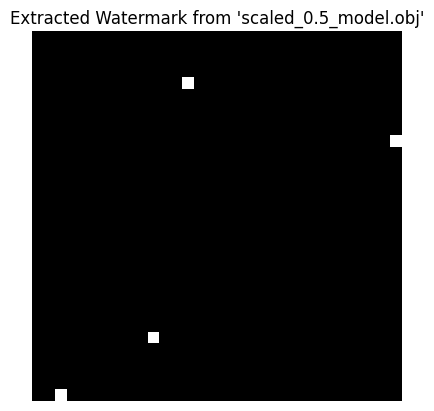


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [35]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'scaled_0.5_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [ ]:
# Cell 10: Evaluation Metrics for 0.5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 22613378.8593
 - NCC (Normalized Cross-Correlation): -0.1280
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 27.9160 dB


In [37]:
# Cell 11: Scaling Attack for 5

# --- Parameters for this attack ---
# Scaling factor (0.5 for 50%, 5 for 500%)
scaling_factor = 5
output_filename = f'scaled_{scaling_factor}_model.obj'
# ------------------------------------

print(f"Applying scaling attack with a factor of {scaling_factor}...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Create the scaling transformation matrix
# The transformation is applied relative to the object's center of mass
scaling_matrix = trimesh.transformations.scale_matrix(
    factor=scaling_factor,
    origin=attacked_mesh.center_mass
)

# Apply the scaling to the mesh
attacked_mesh.apply_transform(scaling_matrix)

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying scaling attack with a factor of 5...
Attacked model saved to 'scaled_5_model.obj'.


--- Extraction After Attack from 'scaled_5_model.obj' ---
Successfully loaded 'scaled_5_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


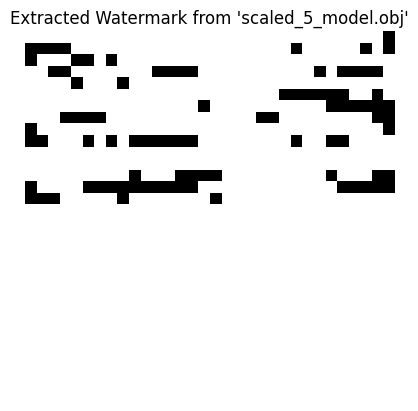


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [38]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'scaled_5_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [39]:
# Cell 10: Evaluation Metrics for 5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 48415822.2535
 - NCC (Normalized Cross-Correlation): -0.1055
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 28.0709 dB


In [ ]:
# Cell 11: Random Noise Attack for 0.01

# --- Parameters for this attack ---
# Noise strength (lambda λ)
noise_strength = 0.01 
output_filename = f'noisy_{noise_strength}_model.obj'
# ------------------------------------

print(f"Applying random noise attack with strength (λ) of {noise_strength}...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Generate random noise with the same shape as the vertices array
# The noise is sampled from a standard normal distribution and then scaled by the strength
noise = np.random.randn(*attacked_mesh.vertices.shape) * noise_strength

# Add the noise to the vertex positions
attacked_mesh.vertices += noise

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying random noise attack with strength (λ) of 0.01...
Attacked model saved to 'noisy_0.01_model.obj'.


--- Extraction After Attack from 'noisy_0.01_model.obj' ---
Successfully loaded 'noisy_0.01_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


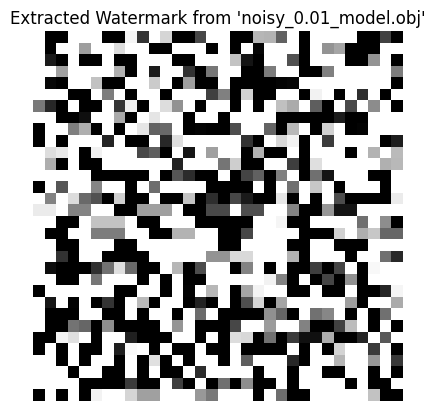


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [41]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'noisy_0.01_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [42]:
# Cell 10: Evaluation Metrics for 5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 432.2149
 - NCC (Normalized Cross-Correlation): 0.1306
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 27.9954 dB


In [43]:
# Cell 11: Random Noise Attack for 0.15

# --- Parameters for this attack ---
# Noise strength (lambda λ)
noise_strength = 0.15
output_filename = f'noisy_{noise_strength}_model.obj'
# ------------------------------------

print(f"Applying random noise attack with strength (λ) of {noise_strength}...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Generate random noise with the same shape as the vertices array
# The noise is sampled from a standard normal distribution and then scaled by the strength
noise = np.random.randn(*attacked_mesh.vertices.shape) * noise_strength

# Add the noise to the vertex positions
attacked_mesh.vertices += noise

# Save the attacked model to its own file
attacked_mesh.export(output_filename)
print(f"Attacked model saved to '{output_filename}'.")


Applying random noise attack with strength (λ) of 0.15...
Attacked model saved to 'noisy_0.15_model.obj'.


--- Extraction After Attack from 'noisy_0.15_model.obj' ---
Successfully loaded 'noisy_0.15_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


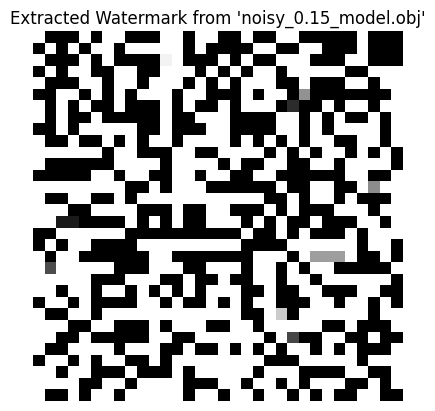


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [45]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'noisy_0.15_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [46]:
# Cell 10: Evaluation Metrics for 5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 6509.7639
 - NCC (Normalized Cross-Correlation): -0.0114
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 27.7964 dB


In [50]:
# Cell 11: Cropping Attack

# --- Parameters for this attack ---
# Percentage of the model to crop away from the top
crop_percentage = 10 
output_filename = f'cropped_{crop_percentage}percent_model.obj'
# The axis to crop along ('x', 'y', or 'z')
crop_axis = 'z'
# ------------------------------------

# NOTE: This attack requires the 'shapely' library for slicing operations.
# If you get an error, you may need to install it by running:
# pip install shapely

print(f"Applying cropping attack, removing {crop_percentage}% of the model...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Determine the axis index (0=x, 1=y, 2=z)
axis_map = {'x': 0, 'y': 1, 'z': 2}
axis_index = axis_map.get(crop_axis, 2)

# Get the bounding box of the model to determine its extent
min_bound, max_bound = attacked_mesh.bounds

# Calculate the point along the axis at which to crop
crop_point = max_bound[axis_index] - (max_bound[axis_index] - min_bound[axis_index]) * (crop_percentage / 100.0)

# Define the plane normal for slicing (points towards the part we want to remove)
plane_normal = [0, 0, 0]
plane_normal[axis_index] = 1.0

# Define the origin of the slicing plane
plane_origin = [0, 0, 0]
plane_origin[axis_index] = crop_point

try:
    # Use a boolean slice to keep only the part of the mesh below the plane
    # This effectively crops the top part of the model
    cropped_mesh = attacked_mesh.slice_plane(plane_origin=plane_origin, plane_normal=plane_normal)

    # Save the attacked model to its own file
    cropped_mesh.export(output_filename)
    print(f"Attacked model saved to '{output_filename}'.")

except ModuleNotFoundError as e:
    if 'shapely' in str(e):
        print("\n--- ERROR ---")
        print("The method 'slice_plane' failed because it requires the 'shapely' library.")
        print("Please install it from your terminal or a new notebook cell:")
        print("!pip install shapely")
        print("After installation, you MUST restart the Jupyter kernel for it to work.")
        print("-------------")
    else:
        # Re-raise the error if it's an unexpected ModuleNotFoundError
        raise e


Applying cropping attack, removing 10% of the model...
Attacked model saved to 'cropped_10percent_model.obj'.


--- Extraction After Attack from 'cropped_10percent_model.obj' ---
Successfully loaded 'cropped_10percent_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


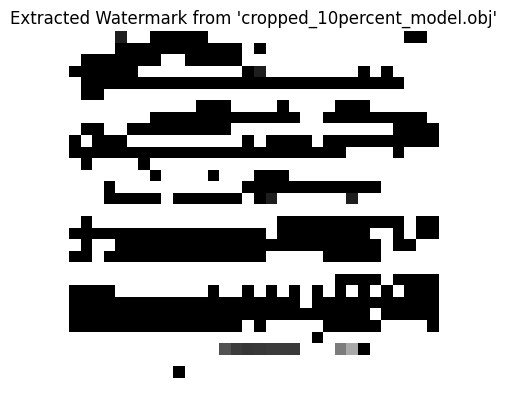


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [51]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'cropped_10percent_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [52]:
# Cell 10: Evaluation Metrics for 5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 14046932.5668
 - NCC (Normalized Cross-Correlation): 0.1082
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 28.0187 dB


In [53]:
# Cell 11: Cropping Attack

# --- Parameters for this attack ---
# Percentage of the model to crop away from the top
crop_percentage = 20
output_filename = f'cropped_{crop_percentage}percent_model.obj'
# The axis to crop along ('x', 'y', or 'z')
crop_axis = 'z'
# ------------------------------------

# NOTE: This attack requires the 'shapely' library for slicing operations.
# If you get an error, you may need to install it by running:
# pip install shapely

print(f"Applying cropping attack, removing {crop_percentage}% of the model...")

# Start with the reloaded watermarked mesh from Cell 8.5
attacked_mesh = reloaded_watermarked_mesh.copy()

# Determine the axis index (0=x, 1=y, 2=z)
axis_map = {'x': 0, 'y': 1, 'z': 2}
axis_index = axis_map.get(crop_axis, 2)

# Get the bounding box of the model to determine its extent
min_bound, max_bound = attacked_mesh.bounds

# Calculate the point along the axis at which to crop
crop_point = max_bound[axis_index] - (max_bound[axis_index] - min_bound[axis_index]) * (crop_percentage / 100.0)

# Define the plane normal for slicing (points towards the part we want to remove)
plane_normal = [0, 0, 0]
plane_normal[axis_index] = 1.0

# Define the origin of the slicing plane
plane_origin = [0, 0, 0]
plane_origin[axis_index] = crop_point

try:
    # Use a boolean slice to keep only the part of the mesh below the plane
    # This effectively crops the top part of the model
    cropped_mesh = attacked_mesh.slice_plane(plane_origin=plane_origin, plane_normal=plane_normal)

    # Save the attacked model to its own file
    cropped_mesh.export(output_filename)
    print(f"Attacked model saved to '{output_filename}'.")

except ModuleNotFoundError as e:
    if 'shapely' in str(e):
        print("\n--- ERROR ---")
        print("The method 'slice_plane' failed because it requires the 'shapely' library.")
        print("Please install it from your terminal or a new notebook cell:")
        print("!pip install shapely")
        print("After installation, you MUST restart the Jupyter kernel for it to work.")
        print("-------------")
    else:
        # Re-raise the error if it's an unexpected ModuleNotFoundError
        raise e


Applying cropping attack, removing 20% of the model...
Attacked model saved to 'cropped_20percent_model.obj'.


--- Extraction After Attack from 'cropped_20percent_model.obj' ---
Successfully loaded 'cropped_20percent_model.obj'.
Displaying the attacked 3D model...


Extracting watermark from the ATTACKED model...
Extraction from attacked model complete.


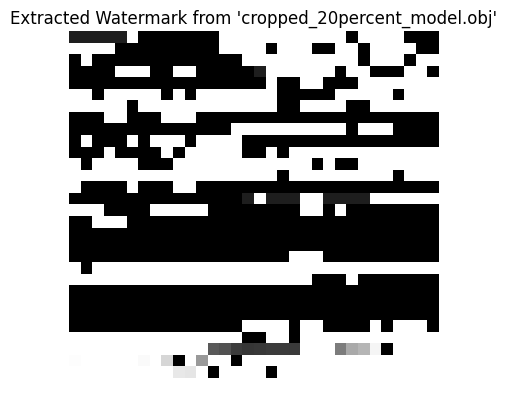


IMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.


In [54]:
# Cell 12: Extract Watermark After Attack

# --- Specify which attacked model to load ---
# This MUST match the 'output_filename' from Cell 11
filename_to_evaluate = 'cropped_20percent_model.obj'
# --------------------------------------------

print(f"--- Extraction After Attack from '{filename_to_evaluate}' ---")

# 1. Load the specified attacked model
loaded_attacked_mesh = None # Initialize variable
try:
    loaded_attacked_mesh = trimesh.load_mesh(filename_to_evaluate)
    attacked_vertices = loaded_attacked_mesh.vertices.astype(np.float64)
    print(f"Successfully loaded '{filename_to_evaluate}'.")
    
    # Visualize the attacked model
    print("Displaying the attacked 3D model...")
    # --- FIX: Use scene().show() for reliable display in Jupyter notebooks ---
    display(loaded_attacked_mesh.scene().show())
    
except Exception as e:
    print(f"Could not load '{filename_to_evaluate}'. Please run the attack cell first.")
    # Create a dummy variable to avoid errors
    loaded_attacked_mesh = reloaded_watermarked_mesh 
    attacked_vertices = watermarked_vertices


# 2. Extract the watermark using the KDTree method
print("Extracting watermark from the ATTACKED model...")
from scipy.spatial import KDTree

original_vertices = mesh.vertices 
extracted_watermark_after_attack = []

# Build KDTree from the attacked vertices
attacked_tree = KDTree(attacked_vertices)
attacked_normals = loaded_attacked_mesh.vertex_normals

for i, vertex_idx in enumerate(target_indices):
    original_v = original_vertices[vertex_idx]
    
    # Find the corresponding vertex in the attacked mesh
    distance, attacked_idx = attacked_tree.query(original_v)
    
    attacked_v = attacked_vertices[attacked_idx]
    normal_v = attacked_normals[attacked_idx]
    
    displacement_vector = attacked_v - original_v
    projected_displacement = np.dot(displacement_vector, normal_v)
    
    extracted_value = projected_displacement / embedding_strength
    extracted_watermark_after_attack.append(extracted_value)

# --- FIX: Corrected the typo from --1 to -1 ---
extracted_watermark_normalized = np.array(extracted_watermark_after_attack).reshape(-1, 1)
extracted_watermark_pixels = scaler.inverse_transform(extracted_watermark_normalized)

# Reshape for visualization
img_size = watermark_img.size
extracted_img_array = np.zeros(img_size[0] * img_size[1])
extracted_img_array[:len(extracted_watermark_pixels)] = extracted_watermark_pixels.flatten()
extracted_img_array = extracted_img_array.reshape(img_size)

print("Extraction from attacked model complete.")

# Visualize the final extracted watermark
plt.imshow(extracted_img_array, cmap='gray', vmin=0, vmax=255)
plt.title(f"Extracted Watermark from '{filename_to_evaluate}'")
plt.axis('off')
plt.show()

print("\nIMPORTANT: Please re-run Cell 10 now to evaluate the robustness of the watermark.")


In [55]:
# Cell 10: Evaluation Metrics for 5 scaling Attacked Model

print("Calculating evaluation metrics...")

# Prepare data for evaluation
original_wm_flat = np.array(watermark_img).flatten()[:len(extracted_watermark_pixels)]
extracted_wm_flat = extracted_watermark_pixels.flatten()

original_img_array = np.array(watermark_img)
# Ensure extracted image is the same size for comparison
padded_extracted_img_array = np.zeros_like(original_img_array)
h, w = extracted_img_array.shape
padded_extracted_img_array[:h, :w] = extracted_img_array


# 1. RMSE (Root Mean Squared Error)
rmse = np.sqrt(np.mean((original_wm_flat - extracted_wm_flat) ** 2))
print(f" - RMSE (Root Mean Squared Error): {rmse:.4f}")

# 2. NCC (Normalized Cross-Correlation)
ncc = np.corrcoef(original_wm_flat, extracted_wm_flat)[0, 1]
print(f" - NCC (Normalized Cross-Correlation): {ncc:.4f}")

# 3. Bit Embedding Rate
bit_embedding_rate = (len(watermark_data) * 8) / len(vertices) # 8 bits per pixel
print(f" - Bit Embedding Rate: {bit_embedding_rate:.4f} bits per vertex")

# 4. Hausdorff Distance
hausdorff_dist_1 = directed_hausdorff(original_vertices, watermarked_vertices)[0]
hausdorff_dist_2 = directed_hausdorff(watermarked_vertices, original_vertices)[0]
hausdorff_distance = max(hausdorff_dist_1, hausdorff_dist_2)
print(f" - Hausdorff Distance: {hausdorff_distance:.6f}")

# 5. PSNR (Peak Signal-to-Noise Ratio)
psnr = calculate_psnr(original_img_array, padded_extracted_img_array)
print(f" - PSNR (Peak Signal-to-Noise Ratio): {psnr:.4f} dB")


Calculating evaluation metrics...
 - RMSE (Root Mean Squared Error): 16954517.6564
 - NCC (Normalized Cross-Correlation): 0.0990
 - Bit Embedding Rate: 0.3629 bits per vertex
 - Hausdorff Distance: 0.005000
 - PSNR (Peak Signal-to-Noise Ratio): 27.9098 dB
